In [1]:
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
from bin import utils

In [2]:
scdata = sc.read_h5ad("./RNA/sc.combined.h5")

In [3]:
ex_gene_df = pd.read_csv("./result_mouse_0.1_1197_genes_human_575_Cd8.csv")[["mouse.gene1", "mouse.gene1.1"]]
ex_gene_df.columns = ["gene1", "gene2"]

In [4]:
ex_gene_df[ex_gene_df["gene1"] == "Xist"]

,gene1,gene2
441,Xist,Ybx1
460,Xist,Ywhaq
473,Xist,Ccl5
741,Xist,Glipr1
1140,Xist,Batf
1267,Xist,Rnaset2b
1268,Xist,Rnaset2a
1376,Xist,Lypla1
1767,Xist,Dusp2
1957,Xist,Klf2


In [47]:
from tqdm import tqdm
perturb_gene = scdata.obs["perturb_gene"].unique().tolist()
ex_genes = {}
cnt = 0
for idx, guide in tqdm(enumerate(perturb_gene)):
    guide = guide.lstrip("sg")
    ex_genes_1 = ex_gene_df.loc[ex_gene_df["gene1"] == guide]["gene2"].tolist()
    ex_genes_2 = ex_gene_df.loc[ex_gene_df["gene2"] == guide]["gene1"].tolist()
    if len(ex_genes_1) + len(ex_genes_2) > 0: ex_genes[guide] = []
    else: continue
    for i in range(np.max([len(ex_genes_1), len(ex_genes_2)])):
        if i < len(ex_genes_1) and ex_genes_1[i] in scdata.var_names:
            cnt += 1
            ex_genes[guide].append(ex_genes_1[i])
        elif i < len(ex_genes_2) and ex_genes_2[i] in scdata.var_names:
            cnt += 1
            ex_genes[guide].append(ex_genes_2[i])
        if cnt >= 20: break
    cnt = 0

fig, axs = plt.subplots(len(ex_genes.keys()), 20, figsize=(50, 250))
for idx, guide in tqdm(enumerate(ex_genes.keys())):
    for idy, ex_gene in enumerate(ex_genes[guide]):
        ax = axs[idx, idy]
        ko_expr = scdata[scdata.obs["perturb_gene"] == ("sg" + guide), ex_gene].X.toarray().flatten()
        ntc_expr = scdata[scdata.obs["perturb_gene"] == "sgNon-targeting", ex_gene].X.toarray().flatten()

        sns.violinplot([ko_expr, ntc_expr], ax=ax)
        
        p = f_oneway(scdata[scdata.obs["perturb_gene"] == ("sg" + guide), ex_gene].X.toarray().flatten(), \
            scdata[scdata.obs["perturb_gene"] == "sgNon-targeting", ex_gene].X.toarray().flatten())[1] // 0.01 * 0.01
        ax.text(0.5, 1, p, ha='center', color='red')
        ax.set_xticks([0, 1])
        ax.set_xticklabels([f"{guide} KO", f"control"])
        ax.set_title(f'{ex_gene}')
        ax.set_xlabel("")
        ax.set_ylabel("")
plt.show()

0it [00:00, ?it/s]

34it [00:00, 636.39it/s]
19it [00:20,  1.08s/it]


In [5]:
from scipy.stats import pearsonr, spearmanr, f_oneway
from tqdm import tqdm

perturb_gene = scdata.obs["perturb_gene"].unique().tolist()
ex_genes = {}
for idx, guide in tqdm(enumerate(perturb_gene)):
    guide = guide.lstrip("sg")
    ex_genes_1 = ex_gene_df.loc[ex_gene_df["gene1"] == guide]["gene2"].tolist()
    ex_genes_2 = ex_gene_df.loc[ex_gene_df["gene2"] == guide]["gene1"].tolist()
    if len(ex_genes_1) + len(ex_genes_2) > 0: ex_genes[guide] = []
    else: continue
    for i in range(np.max([len(ex_genes_1), len(ex_genes_2)])):
        if i < len(ex_genes_1) and ex_genes_1[i] in scdata.var_names:
            ex_genes[guide].append(ex_genes_1[i])
        elif i < len(ex_genes_2) and ex_genes_2[i] in scdata.var_names:
            ex_genes[guide].append(ex_genes_2[i])

34it [00:00, 491.54it/s]


# spatially

In [9]:
annotation = sc.read_h5ad("./RNA/spatial.combined.annotation.h5")

In [19]:
t_data = annotation[annotation.obs["annotations"].str.endswith("T")].copy()
cdata = t_data[:, t_data.var_names.str.startswith('sg')]

In [20]:
cdata = utils.combine_guide_replicates(cdata)

/home/wpy/stereoseq/20240702-Exclusive/bin/utils.py:78: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [32]:
corr_matrix = []
for idx, guide in tqdm(enumerate(ex_genes.keys())):
    if 'sg' + guide not in cdata.var_names: continue
    for idy, ex_gene in enumerate(ex_genes[guide]):
        ntc_corr = spearmanr(t_data[:, ex_gene].X.toarray().flatten(), cdata[:, "sgNon-targeting"].X.toarray().flatten())[0]
        guide_corr = spearmanr(t_data[:, ex_gene].X.toarray().flatten(), cdata[:, 'sg' + guide].X.toarray().flatten())[0]
        corr_matrix.append([guide, ex_gene, ntc_corr, guide_corr])
print(corr_matrix)

3it [00:01,  1.84it/s]/tmp/ipykernel_8222/837282817.py:5: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  ntc_corr = spearmanr(t_data[:, ex_gene].X.toarray().flatten(), cdata[:, "sgNon-targeting"].X.toarray().flatten())[0]
/tmp/ipykernel_8222/837282817.py:6: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  guide_corr = spearmanr(t_data[:, ex_gene].X.toarray().flatten(), cdata[:, 'sg' + guide].X.toarray().flatten())[0]
19it [00:18,  1.05it/s]

[['Batf', 'Il7r', 0.029186765028893717, 0.033283393151933134], ['Batf', 'Tcf7', 0.014589967260124896, -0.00465796711502641], ['Batf', 'Ccr7', 0.0036699640912990924, 0.01907169420284712], ['Batf', 'Sell', 0.004221935470640946, 0.006270496830349713], ['Batf', 'S1pr1', -0.00410987575389937, -0.003723952723290326], ['Batf', 'Arl4c', -0.006781094100761461, -0.006144339964403926], ['Batf', 'Ssh2', 0.0072477101879194475, 0.009400433550534484], ['Batf', 'Hmgn1', -0.0016254471843648469, 0.0012756806835905934], ['Batf', 'Cd7', -0.003069659145818284, -0.0027814138967089926], ['Bhlhe40', 'Sell', 0.004221935470640946, 0.023012892044756445], ['Bhlhe40', 'Il7r', 0.029186765028893717, 0.03502759301474528], ['Bhlhe40', 'Ccdc85b', -0.0028770303352047546, -0.001330331037559852], ['Bhlhe40', 'Rnaset2a', -0.010803111851273502, -0.0049953296710571506], ['Bhlhe40', 'Rnaset2b', 0.00827332156735318, -0.005034722190732717], ['Bhlhe40', 'Add3', 0.024040409791866717, 0.057959130144052705], ['Bhlhe40', 'Arl4c', -0

In [79]:
c_df = pd.DataFrame(corr_matrix, columns=['Guide', 'Exclusive Gene', 'NTC correlation', 'Perturbed correlation']).set_index(['Guide'])

In [80]:
c_df.index.get_level_values(0).unique()

Index(['Batf', 'Bhlhe40', 'Hopx', 'Klf2', 'Ddit4', 'Bcl2l11', 'Elob', 'Ccr7',
       'Tgif1', 'Foxp1', 'Tox', 'Bcl2', 'Jund', 'Jun', 'Fos', 'Cxcr6', 'Ybx1',
       'Cxcr3'],
      dtype='object', name='Guide')

In [70]:
c_df.loc['Batf']

,NTC correlation,Perturbed correltation
Exclusive Gene,,
Il7r,0.029187,0.033283
Tcf7,0.014590,-0.004658
Ccr7,0.003670,0.019072
Sell,0.004222,0.006270
S1pr1,-0.004110,-0.003724
Arl4c,-0.006781,-0.006144
Ssh2,0.007248,0.009400
Hmgn1,-0.001625,0.001276
Cd7,-0.003070,-0.002781


Text(0.5, 1.0, 'Correlation of guide condition to T in spatial')

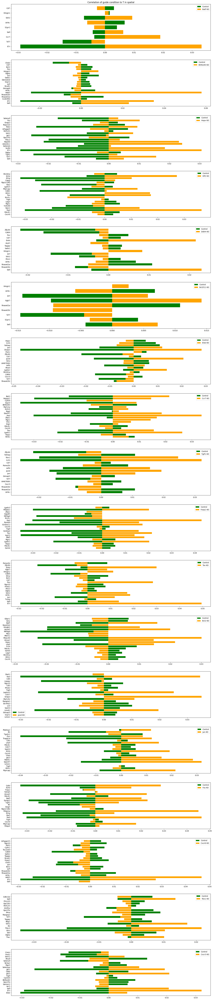

In [89]:
fig, axs = plt.subplots(len(c_df.index.get_level_values(0).unique()), 1, figsize=(20, 100))
for idx, guide in enumerate(c_df.index.get_level_values(0).unique()):
    ax = axs[idx]
    if len(c_df.loc[guide].index) > 20:
        d_df = c_df.loc[guide][:20]
    else:
        d_df = c_df.loc[guide]
    ax.barh(d_df.loc[guide]["Exclusive Gene"], -d_df.loc[guide]["NTC correlation"], label='Control', color='green')
    ax.barh(d_df.loc[guide]["Exclusive Gene"], d_df.loc[guide]["Perturbed correlation"], label=f'{guide} KO', color='orange')
    ax.legend()
axs[0].set_title("Correlation of guide condition to T in spatial")

In [98]:
# perturbed bins ~ ntc perturbed bins
ntc_bins = t_data[cdata[:, 'sgNon-targeting'].X.toarray().flatten() > 0].copy()
fig, axs = plt.subplots(20, 10, figsize=(80, 200))
for idx, guide in tqdm(enumerate(ex_genes.keys())):
    if 'sg' + guide not in cdata.var_names: continue
    perturb_bins = t_data[cdata[:, 'sg' + guide].X.toarray().flatten() > 0].copy()
    cnt = 0
    for idy, ex_gene in enumerate(ex_genes[guide]):

        ax = axs[idx, cnt]
        # distribution
        ntc_expr = ntc_bins[:, ex_gene].X.toarray().flatten()
        guide_expr = perturb_bins[:, ex_gene].X.toarray().flatten()

        sns.boxplot([ntc_expr, guide_expr], ax=ax)
        
        # anova
        p = f_oneway(ntc_expr, guide_expr)[1]
        ax.text(0.5, np.max([np.max(ntc_expr), np.max(guide_expr)]), p, ha='center')
        cnt += 1
        if cnt >= 10: break

0it [00:00, ?it/s]/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)
1it [00:00,  3.06it/s]/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_ou